In [1]:
import pandas as pd
import numpy as np
from utility import *
import matplotlib.pyplot as plt
from scipy import stats

In [2]:
base = "/Users/claxl/Documents/GitHub/MLProject/Data Exploration/EDA/clearData/"

In [267]:
df_train_est_A, df_train_obs_A, df_test_A = readData(base,1)
df_train_est_B, df_train_obs_B, df_test_B = readData(base,2)
df_train_est_C, df_train_obs_C, df_test_C = readData(base,3)

In [268]:
df_train_est_A.set_index('date_forecast', inplace=True)
df_train_obs_A.set_index('date_forecast', inplace=True)
df_test_A.set_index('date_forecast', inplace=True)

df_train_est_B.set_index('date_forecast', inplace=True)
df_train_obs_B.set_index('date_forecast', inplace=True)
df_test_B.set_index('date_forecast', inplace=True)

df_train_est_C.set_index('date_forecast', inplace=True)
df_train_obs_C.set_index('date_forecast', inplace=True)
df_test_C.set_index('date_forecast', inplace=True)

## 1. DATASET A

In [5]:
df_train_est_A.isnull().mean()

absolute_humidity_2m:gm3          0.005432
air_density_2m:kgm3               0.005432
ceiling_height_agl:m              0.215029
clear_sky_energy_1h:J             0.005432
clear_sky_rad:W                   0.005432
cloud_base_agl:m                  0.117700
dew_or_rime:idx                   0.005432
dew_point_2m:K                    0.005432
diffuse_rad:W                     0.005432
diffuse_rad_1h:J                  0.005432
direct_rad:W                      0.005432
direct_rad_1h:J                   0.005432
effective_cloud_cover:p           0.005432
elevation:m                       0.005432
fresh_snow_12h:cm                 0.005432
fresh_snow_1h:cm                  0.005432
fresh_snow_24h:cm                 0.005432
fresh_snow_3h:cm                  0.005432
fresh_snow_6h:cm                  0.005432
is_day:idx                        0.005432
is_in_shadow:idx                  0.005432
msl_pressure:hPa                  0.005432
precip_5min:mm                    0.005432
precip_type

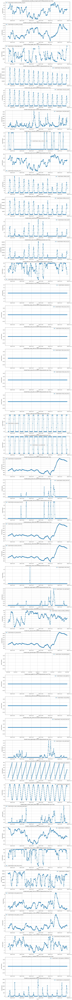

In [6]:
df = df_train_est_A
df.index = pd.to_datetime(df.index)
# Number of features to plot
num_features = len(df.columns)

# Creating a figure
plt.figure(figsize=(15, 5*num_features))

for i, col in enumerate(df.columns, 1):
    plt.subplot(num_features, 1, i)

    plt.plot( df[col][100:400], label=f'Scaled Feature: {col}', linestyle='-', marker='o')
    plt.xlabel('Time')
    plt.ylabel('Scaled Values')
    plt.title(f'Scaled {col} and PV Measurement over Time')
    plt.legend()
    plt.grid(True)
plt.show()

In [7]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=24)
df_train_est_A_imputed = pd.DataFrame(imputer.fit_transform(df), columns = df.columns)

In [8]:
df_train_est_A_imputed.describe()

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,...,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,pv_measurement
count,4418.000000,4418.000000,4418.000000,4.418000e+03,4418.000000,4418.000000,4418.000000,4418.000000,4418.000000,4.418000e+03,...,4418.000000,4418.000000,4418.000000,4418.000000,4418.000000,4418.000000,4418.000000,4418.000000,4418.0,4418.000000
mean,4.087207,1.281779,3506.009547,2.364355e+05,65.670760,1661.990761,0.008943,270.204547,22.787681,8.204543e+04,...,-10.705093,0.032478,274.710301,73.817735,33480.812447,3.180335,-0.014410,0.926577,0.0,338.149710
std,1.509091,0.029964,2333.536146,5.147309e+05,143.428313,1642.938200,0.211133,5.209366,45.521187,1.617979e+05,...,21.612688,0.079007,4.629965,35.474558,16762.057781,1.783117,3.049807,1.754289,0.0,889.622574
min,1.000000,1.212000,27.925000,0.000000e+00,0.000000,27.800000,-1.000000,254.700000,0.000000,0.000000e+00,...,-49.889500,0.000000,259.775000,0.000000,197.850000,0.125000,-7.150000,-5.300000,0.0,0.000000
25%,3.000000,1.262000,1560.075000,0.000000e+00,0.000000,549.025000,0.000000,266.800000,0.000000,0.000000e+00,...,-27.833000,0.000000,271.800000,50.081250,20187.050000,1.725000,-2.200000,-0.150000,0.0,0.000000
50%,3.900000,1.279750,3371.175000,0.000000e+00,0.000000,1135.750000,0.000000,270.393749,0.000000,0.000000e+00,...,-9.758125,0.000000,274.700000,96.325000,34515.737500,2.925000,-0.312500,0.975000,0.0,0.000000
75%,5.050000,1.300500,4953.368750,1.367793e+05,37.818750,2165.137350,0.000000,273.875000,22.275002,8.009028e+04,...,4.454250,0.000000,277.800000,100.000000,47414.692250,4.275000,1.550000,2.000000,0.0,124.355000
max,8.750000,1.373250,12294.901000,2.540279e+06,709.825000,10813.700000,1.000000,282.100000,294.100000,1.030832e+06,...,41.091750,0.750000,285.800000,100.000000,68108.500000,10.175000,9.950000,6.625000,0.0,5172.640000


In [9]:
df_train_est_A_imputed.isnull().mean()

absolute_humidity_2m:gm3          0.0
air_density_2m:kgm3               0.0
ceiling_height_agl:m              0.0
clear_sky_energy_1h:J             0.0
clear_sky_rad:W                   0.0
cloud_base_agl:m                  0.0
dew_or_rime:idx                   0.0
dew_point_2m:K                    0.0
diffuse_rad:W                     0.0
diffuse_rad_1h:J                  0.0
direct_rad:W                      0.0
direct_rad_1h:J                   0.0
effective_cloud_cover:p           0.0
elevation:m                       0.0
fresh_snow_12h:cm                 0.0
fresh_snow_1h:cm                  0.0
fresh_snow_24h:cm                 0.0
fresh_snow_3h:cm                  0.0
fresh_snow_6h:cm                  0.0
is_day:idx                        0.0
is_in_shadow:idx                  0.0
msl_pressure:hPa                  0.0
precip_5min:mm                    0.0
precip_type_5min:idx              0.0
pressure_100m:hPa                 0.0
pressure_50m:hPa                  0.0
prob_rime:p 

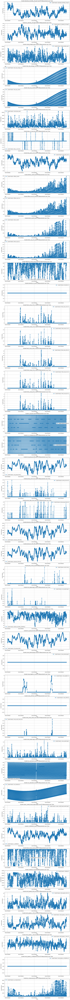

In [10]:
df = df_train_est_A_imputed
df.index = pd.to_datetime(df.index)
# Number of features to plot
num_features = len(df.columns)

# Creating a figure
plt.figure(figsize=(15, 5*num_features))

for i, col in enumerate(df.columns, 1):
    plt.subplot(num_features, 1, i)

    plt.plot( df[col],label=f'Scaled Feature: {col}', linestyle='-', marker='o')
    plt.xlabel('Time')
    plt.ylabel('Scaled Values')
    plt.title(f'Scaled {col} and PV Measurement over Time')
    plt.legend()
    plt.grid(True)
plt.show()

In [11]:
 df_train_est_A_imputed.index = df_train_est_A.index

In [12]:
 df_train_est_A_imputed['hour'] = df_train_est_A_imputed.index.hour

In [13]:
df_train_est_A_imputed

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,...,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,pv_measurement,hour
date_forecast,,,,,,,,,,,,,,,,,,,,,
2022-10-28 22:00:00,8.350,1.23300,2416.250,0.000,0.000,1734.950,1.0,281.27500,0.000,0.000,...,0.000,284.67502,100.000,20712.525,0.700,-0.325,0.650,0.0,0.00,22
2022-10-28 23:00:00,8.100,1.23400,4035.200,0.000,0.000,2059.875,1.0,280.85000,0.000,0.000,...,0.000,284.32500,100.000,5624.175,0.775,0.425,0.525,0.0,0.00,23
2022-10-29 00:00:00,8.150,1.22975,1882.000,0.000,0.000,1675.050,1.0,280.92500,0.000,0.000,...,0.200,283.87500,100.000,3240.425,1.500,1.050,0.975,0.0,0.00,0
2022-10-29 01:00:00,8.200,1.22850,1622.400,0.000,0.000,1547.550,1.0,281.05000,0.000,0.000,...,0.250,284.35000,100.000,3243.500,1.575,1.000,1.200,0.0,0.00,1
2022-10-29 02:00:00,8.375,1.22700,1322.275,0.000,0.000,1053.725,1.0,281.34998,0.000,0.000,...,0.250,284.52500,100.000,2528.450,2.200,1.825,1.175,0.0,0.00,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-04-30 19:00:00,4.550,1.27650,1674.200,84464.945,4.225,542.700,0.0,272.42500,2.825,56431.050,...,0.000,275.02500,96.700,23417.074,5.175,4.800,1.925,0.0,9.02,19
2023-04-30 20:00:00,4.500,1.27975,1762.400,2270.875,0.000,546.400,0.0,272.30000,0.000,5067.875,...,0.000,274.65002,94.525,21084.050,4.650,4.025,2.300,0.0,0.00,20
2023-04-30 21:00:00,4.500,1.28100,1696.650,0.000,0.000,548.350,0.0,272.30000,0.000,0.000,...,0.000,274.52500,95.675,20792.500,4.450,3.575,2.600,0.0,0.00,21


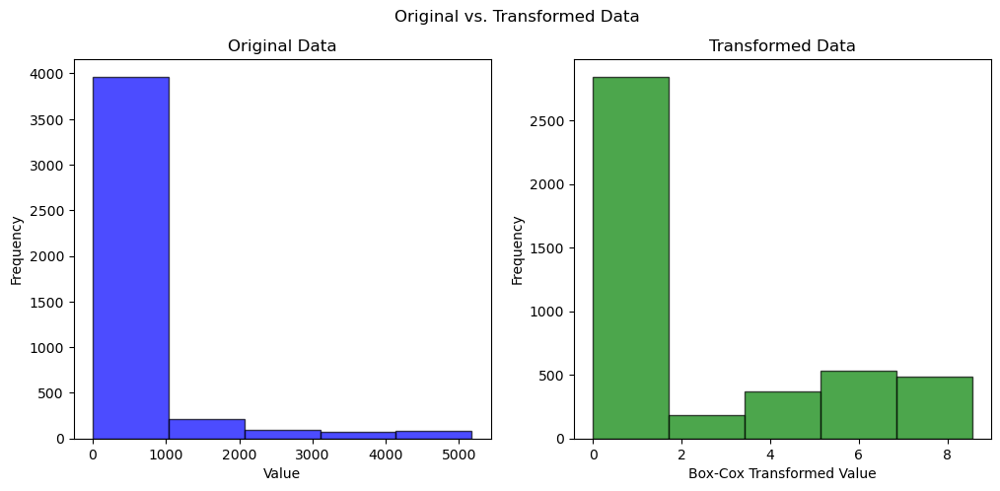

In [14]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
original_data = df_train_est_A_imputed['pv_measurement']


# Adding a small constant to avoid division by zero
epsilon = 1e-6
data_with_epsilon = [x + epsilon if x == 0 else x for x in original_data]

# Apply the Box-Cox transformation
transformed_data = np.log(original_data + 1)

# Create a DataFrame to see the original and transformed data side by side
df = pd.DataFrame({'Original Data': original_data, 'Transformed Data': transformed_data})

# Create a figure and two subplots for original and transformed data
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
fig.suptitle('Original vs. Transformed Data')

# Plot the original data
axes[0].hist(original_data, bins=5, edgecolor='black', alpha=0.7, color='blue')
axes[0].set_title('Original Data')
axes[0].set_xlabel('Value')
axes[0].set_ylabel('Frequency')

# Plot the transformed data
axes[1].hist(transformed_data, bins=5, edgecolor='black', alpha=0.7, color='green')
axes[1].set_title('Transformed Data')
axes[1].set_xlabel('Box-Cox Transformed Value')
axes[1].set_ylabel('Frequency')

plt.show()

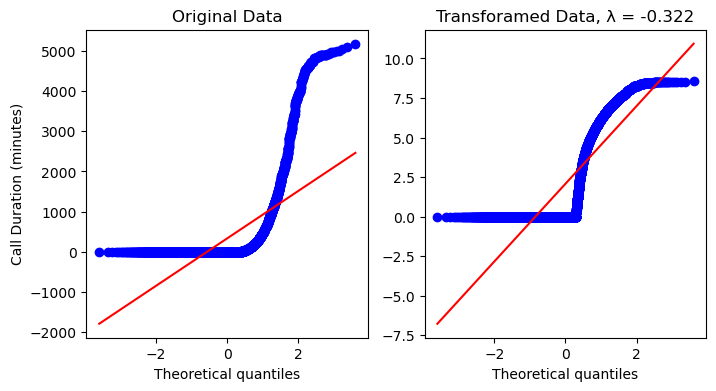

In [15]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))

prob = stats.probplot(original_data, dist=stats.norm, plot=ax1)
prob = stats.probplot(transformed_data, dist=stats.norm, plot=ax2)

ax1.set_title('Original Data')
ax1.set_ylabel('Call Duration (minutes)')
ax2.set_title('Transforamed Data, λ = %s' % -0.322);
ax2.set_ylabel('');

## 2. All Dataset with encoding

In [16]:
df_train_A = pd.concat([df_train_est_A,df_train_obs_A])
df_train_A['Location'] = 'A'
df_train_B = pd.concat([df_train_est_B,df_train_obs_B])
df_train_B['Location'] = 'B'
df_train_C = pd.concat([df_train_est_C,df_train_obs_C])
df_train_C['Location'] = 'C'

In [17]:
df_train_A.isna().mean()

absolute_humidity_2m:gm3          0.000704
air_density_2m:kgm3               0.000704
ceiling_height_agl:m              0.180461
clear_sky_energy_1h:J             0.000704
clear_sky_rad:W                   0.000704
cloud_base_agl:m                  0.070031
dew_or_rime:idx                   0.000704
dew_point_2m:K                    0.000704
diffuse_rad:W                     0.000704
diffuse_rad_1h:J                  0.000704
direct_rad:W                      0.000704
direct_rad_1h:J                   0.000704
effective_cloud_cover:p           0.000704
elevation:m                       0.000704
fresh_snow_12h:cm                 0.000704
fresh_snow_1h:cm                  0.000704
fresh_snow_24h:cm                 0.000704
fresh_snow_3h:cm                  0.000704
fresh_snow_6h:cm                  0.000704
is_day:idx                        0.000704
is_in_shadow:idx                  0.000704
msl_pressure:hPa                  0.000704
precip_5min:mm                    0.000704
precip_type

In [18]:
df_train_B.isna().mean()

absolute_humidity_2m:gm3          0.000731
air_density_2m:kgm3               0.000731
ceiling_height_agl:m              0.157792
clear_sky_energy_1h:J             0.000731
clear_sky_rad:W                   0.000731
cloud_base_agl:m                  0.066855
dew_or_rime:idx                   0.000731
dew_point_2m:K                    0.000731
diffuse_rad:W                     0.000731
diffuse_rad_1h:J                  0.000731
direct_rad:W                      0.000731
direct_rad_1h:J                   0.000731
effective_cloud_cover:p           0.000731
elevation:m                       0.000731
fresh_snow_12h:cm                 0.000731
fresh_snow_1h:cm                  0.000731
fresh_snow_24h:cm                 0.000731
fresh_snow_3h:cm                  0.000731
fresh_snow_6h:cm                  0.000731
is_day:idx                        0.000731
is_in_shadow:idx                  0.000731
msl_pressure:hPa                  0.000731
precip_5min:mm                    0.000731
precip_type

In [19]:
df_train_C.isna().mean()

absolute_humidity_2m:gm3          0.000746
air_density_2m:kgm3               0.000746
ceiling_height_agl:m              0.170461
clear_sky_energy_1h:J             0.000746
clear_sky_rad:W                   0.000746
cloud_base_agl:m                  0.078777
dew_or_rime:idx                   0.000746
dew_point_2m:K                    0.000746
diffuse_rad:W                     0.000746
diffuse_rad_1h:J                  0.000746
direct_rad:W                      0.000746
direct_rad_1h:J                   0.000746
effective_cloud_cover:p           0.000746
elevation:m                       0.000746
fresh_snow_12h:cm                 0.000746
fresh_snow_1h:cm                  0.000746
fresh_snow_24h:cm                 0.000746
fresh_snow_3h:cm                  0.000746
fresh_snow_6h:cm                  0.000746
is_day:idx                        0.000746
is_in_shadow:idx                  0.000746
msl_pressure:hPa                  0.000746
precip_5min:mm                    0.000746
precip_type

In [20]:
df_train = pd.concat([df_train_A,df_train_B,df_train_C])

In [21]:
df_train

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,...,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,pv_measurement,Location
date_forecast,,,,,,,,,,,,,,,,,,,,,
2022-10-28 22:00:00,8.350,1.23300,2416.250,0.000,0.000,1734.950,1.0,281.27500,0.00,0.000,...,0.000,284.67502,100.0,20712.525,0.700,-0.325,0.650,0.0,0.0,A
2022-10-28 23:00:00,8.100,1.23400,4035.200,0.000,0.000,2059.875,1.0,280.85000,0.00,0.000,...,0.000,284.32500,100.0,5624.175,0.775,0.425,0.525,0.0,0.0,A
2022-10-29 00:00:00,8.150,1.22975,1882.000,0.000,0.000,1675.050,1.0,280.92500,0.00,0.000,...,0.200,283.87500,100.0,3240.425,1.500,1.050,0.975,0.0,0.0,A
2022-10-29 01:00:00,8.200,1.22850,1622.400,0.000,0.000,1547.550,1.0,281.05000,0.00,0.000,...,0.250,284.35000,100.0,3243.500,1.575,1.000,1.200,0.0,0.0,A
2022-10-29 02:00:00,8.375,1.22700,1322.275,0.000,0.000,1053.725,1.0,281.34998,0.00,0.000,...,0.250,284.52500,100.0,2528.450,2.200,1.825,1.175,0.0,0.0,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-01 17:00:00,5.825,1.24975,1899.750,821612.600,164.050,799.200,0.0,276.20000,75.30,322267.000,...,0.000,280.67502,100.0,38671.550,2.875,2.850,-0.350,0.0,NaN,C
2022-05-01 18:00:00,5.650,1.25125,1280.150,387630.380,58.125,921.000,0.0,275.72500,35.70,199808.340,...,0.050,280.42500,100.0,38724.477,3.100,3.075,0.400,0.0,NaN,C
2022-05-01 19:00:00,5.350,1.25350,3248.175,96742.520,5.675,1823.900,0.0,274.85000,3.75,70994.520,...,0.075,280.00000,100.0,38617.700,3.425,2.975,1.700,0.0,NaN,C


#### One hot encoder

In [22]:
locations = df_train['Location']
location_df = pd.get_dummies(locations, prefix='Location')
location_df

,Location_A,Location_B,Location_C
date_forecast,,,
2022-10-28 22:00:00,1,0,0
2022-10-28 23:00:00,1,0,0
2022-10-29 00:00:00,1,0,0
2022-10-29 01:00:00,1,0,0
2022-10-29 02:00:00,1,0,0
...,...,...,...
2022-05-01 17:00:00,0,0,1
2022-05-01 18:00:00,0,0,1
2022-05-01 19:00:00,0,0,1


In [23]:
df_with_location = pd.merge(df_train.drop(columns = 'Location'), location_df, left_index=True, right_index=True)


In [24]:
df_with_location

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,...,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,pv_measurement,Location_A,Location_B,Location_C
date_forecast,,,,,,,,,,,,,,,,,,,,,
2022-10-28 22:00:00,8.350,1.23300,2416.2500,0.0,0.0,1734.950,1.0,281.27500,0.0,0.0,...,100.000,20712.525,0.700,-0.325,0.650,0.0,0.0,1,0,0
2022-10-28 23:00:00,8.100,1.23400,4035.2000,0.0,0.0,2059.875,1.0,280.85000,0.0,0.0,...,100.000,5624.175,0.775,0.425,0.525,0.0,0.0,1,0,0
2022-10-29 00:00:00,8.150,1.22975,1882.0000,0.0,0.0,1675.050,1.0,280.92500,0.0,0.0,...,100.000,3240.425,1.500,1.050,0.975,0.0,0.0,1,0,0
2022-10-29 01:00:00,8.200,1.22850,1622.4000,0.0,0.0,1547.550,1.0,281.05000,0.0,0.0,...,100.000,3243.500,1.575,1.000,1.200,0.0,0.0,1,0,0
2022-10-29 02:00:00,8.375,1.22700,1322.2750,0.0,0.0,1053.725,1.0,281.34998,0.0,0.0,...,100.000,2528.450,2.200,1.825,1.175,0.0,0.0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-04-30 22:00:00,4.400,1.27975,1240.6000,0.0,0.0,551.500,0.0,271.95000,0.0,0.0,...,99.425,11856.700,3.275,2.325,2.325,0.0,-0.0,0,0,1
2023-04-30 23:00:00,4.500,1.28025,1627.9751,0.0,0.0,526.200,0.0,272.25000,0.0,0.0,...,99.700,12009.100,3.750,2.750,2.575,0.0,-0.0,0,1,0
2023-04-30 23:00:00,4.500,1.28025,1627.9751,0.0,0.0,526.200,0.0,272.25000,0.0,0.0,...,99.700,12009.100,3.750,2.750,2.575,0.0,-0.0,0,0,1


#### Get Hours feature

In [25]:
df_with_location.index = pd.to_datetime(df_with_location.index)

In [26]:
df_with_location['hours'] = df_with_location.index.hour

## 2.1 Outliers

In [32]:
outliers_columns = df_with_location.drop(columns = ['Location_A','Location_B','Location_C','hours']).columns
outliers_columns

Index(['absolute_humidity_2m:gm3', 'air_density_2m:kgm3',
       'ceiling_height_agl:m', 'clear_sky_energy_1h:J', 'clear_sky_rad:W',
       'cloud_base_agl:m', 'dew_or_rime:idx', 'dew_point_2m:K',
       'diffuse_rad:W', 'diffuse_rad_1h:J', 'direct_rad:W', 'direct_rad_1h:J',
       'effective_cloud_cover:p', 'elevation:m', 'fresh_snow_12h:cm',
       'fresh_snow_1h:cm', 'fresh_snow_24h:cm', 'fresh_snow_3h:cm',
       'fresh_snow_6h:cm', 'is_day:idx', 'is_in_shadow:idx',
       'msl_pressure:hPa', 'precip_5min:mm', 'precip_type_5min:idx',
       'pressure_100m:hPa', 'pressure_50m:hPa', 'prob_rime:p',
       'rain_water:kgm2', 'relative_humidity_1000hPa:p', 'sfc_pressure:hPa',
       'snow_density:kgm3', 'snow_depth:cm', 'snow_drift:idx',
       'snow_melt_10min:mm', 'snow_water:kgm2', 'sun_azimuth:d',
       'sun_elevation:d', 'super_cooled_liquid_water:kgm2', 't_1000hPa:K',
       'total_cloud_cover:p', 'visibility:m', 'wind_speed_10m:ms',
       'wind_speed_u_10m:ms', 'wind_speed_v_10

In [33]:
import numpy as np
import pandas as pd
from scipy import stats

# Sample dataset with outliers
df_no_outliers = df_with_location[outliers_columns]
# Calculate Z-scores for each column
z_scores = np.abs(stats.zscore(df_no_outliers))

# Define a Z-score threshold (e.g., 2 standard deviations)
z_score_threshold = 2

# Create a boolean mask for identifying outliers
outlier_mask = z_scores > z_score_threshold
# Define the window size (12 values before and 12 values after)
window_size = 12

# Replace outliers with the mean of the surrounding values for each column
for column in df_no_outliers.columns:
    for i in range(len(df_no_outliers)):
        if outlier_mask[column][i]:
            start = max(i - window_size, 0)
            end = min(i + window_size + 1, len(df_no_outliers))
            df_no_outliers[column][i] = df_no_outliers[column][start:end].mean()
            

In [29]:
df_no_outliers.describe()

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,...,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,pv_measurement
count,265300.000000,265300.000000,220366.000000,2.653000e+05,265300.000000,247029.000000,265300.000000,265300.000000,265300.000000,2.653000e+05,...,265300.000000,265300.000000,265300.000000,265300.000000,265300.000000,265300.000000,265300.000000,265300.000000,265300.000000,250904.000000
mean,6.118194,1.253937,2787.188454,5.339181e+05,148.310694,1734.535135,0.005586,275.477709,40.368895,1.453247e+05,...,-0.606284,0.058422,279.688645,73.493638,33042.739354,3.016536,0.697916,0.674384,0.000048,273.169627
std,2.752763,0.036891,2490.250805,8.331514e+05,232.019397,1783.048363,0.241848,6.869993,61.057563,2.172109e+05,...,24.039337,0.107135,6.604983,33.954149,17992.596902,1.748755,2.762390,1.883613,0.006517,740.923510
min,0.500000,1.139250,27.800000,0.000000e+00,0.000000,27.500000,-1.000000,247.425000,0.000000,0.000000e+00,...,-49.932000,0.000000,258.025000,0.000000,132.375000,0.025000,-7.225000,-8.400000,-0.100000,-0.000000
25%,4.100000,1.229000,1055.550000,0.000000e+00,0.000000,607.250000,0.000000,270.950000,0.000000,0.000000e+00,...,-17.795750,0.000000,275.100000,52.850000,16687.150000,1.650000,-1.300000,-0.600000,0.000000,0.000000
50%,5.525000,1.253250,1810.500000,1.554360e+04,2.475000,1181.425000,0.000000,275.200000,1.450000,1.355062e+04,...,-0.389500,0.000000,278.900000,92.550000,37124.977000,2.675000,0.325000,0.700000,0.000000,0.000000
75%,7.975000,1.277500,3745.700000,8.488608e+05,234.349992,2084.850000,0.000000,280.800000,67.550000,2.429002e+05,...,16.149500,0.100000,284.250000,99.875000,48392.824000,4.025000,2.500000,1.875000,0.000000,166.600000
max,18.700000,1.441000,12294.901000,2.990596e+06,835.650000,11673.725000,1.000000,294.925000,334.750000,1.198315e+06,...,49.943750,1.375000,303.250000,100.000000,75489.330000,13.275000,11.200000,8.825000,0.100000,5733.420000


In [38]:
df_no_outliers['Location_A'] = df_with_location['Location_A']
df_no_outliers['Location_B'] = df_with_location['Location_B']
df_no_outliers['Location_C'] = df_with_location['Location_C']
df_no_outliers['hours'] = df_with_location['hours']
df_no_outliers

C:\Users\claxl\AppData\Local\Temp\ipykernel_27408\2006349814.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_no_outliers['Location_A'] = df_with_location['Location_A']


,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,...,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,pv_measurement,dew,rime,Location_A,Location_B,Location_C,hours
date_forecast,,,,,,,,,,,,,,,,,,,,,
2022-10-28 22:00:00,8.350,1.23300,2416.2500,0.0,0.0,1734.950,1.0,281.27500,0.0,0.0,...,-0.325,0.650,0.0,0.0,1,0,1,0,0,22
2022-10-28 23:00:00,8.100,1.23400,4035.2000,0.0,0.0,2059.875,1.0,280.85000,0.0,0.0,...,0.425,0.525,0.0,0.0,1,0,1,0,0,23
2022-10-29 00:00:00,8.150,1.22975,1882.0000,0.0,0.0,1675.050,1.0,280.92500,0.0,0.0,...,1.050,0.975,0.0,0.0,1,0,1,0,0,0
2022-10-29 01:00:00,8.200,1.22850,1622.4000,0.0,0.0,1547.550,1.0,281.05000,0.0,0.0,...,1.000,1.200,0.0,0.0,1,0,1,0,0,1
2022-10-29 02:00:00,8.375,1.22700,1322.2750,0.0,0.0,1053.725,1.0,281.34998,0.0,0.0,...,1.825,1.175,0.0,0.0,1,0,1,0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-04-30 22:00:00,4.400,1.27975,1240.6000,0.0,0.0,551.500,0.0,271.95000,0.0,0.0,...,2.325,2.325,0.0,-0.0,0,0,0,0,1,22
2023-04-30 23:00:00,4.500,1.28025,1627.9751,0.0,0.0,526.200,0.0,272.25000,0.0,0.0,...,2.750,2.575,0.0,-0.0,0,0,0,1,0,23
2023-04-30 23:00:00,4.500,1.28025,1627.9751,0.0,0.0,526.200,0.0,272.25000,0.0,0.0,...,2.750,2.575,0.0,-0.0,0,0,0,0,1,23


#### dew_or_rime split

In [71]:
df_dew_rime = df_no_outliers
df_dew_rime['dew'] = np.where(df_dew_rime['dew_or_rime:idx'] == 1, 1, 0)
df_dew_rime['rime'] = np.where(df_dew_rime['dew_or_rime:idx'] == -1, 1, 0)
df_dew_rime = df_dew_rime.drop(columns = 'dew_or_rime:idx')
df_dew_rime.describe()

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,direct_rad:W,...,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,pv_measurement,dew,rime,Location_A,Location_B,Location_C,hours
count,265300.000000,265300.000000,220366.000000,2.653000e+05,265300.000000,247029.000000,265300.000000,265300.000000,2.653000e+05,265300.000000,...,265300.000000,265300.000000,265300.000000,250904.000000,265420.000000,265420.000000,265420.000000,265420.000000,265420.000000,265420.000000
mean,6.118194,1.253937,2787.188454,5.339181e+05,148.310694,1734.535135,275.477709,40.368895,1.453247e+05,52.161377,...,0.697916,0.674384,0.000048,273.169627,0.028114,0.025036,0.320880,0.340909,0.338211,11.501839
std,2.752763,0.036891,2490.250805,8.331514e+05,232.019397,1783.048363,6.869993,61.057563,2.172109e+05,115.256328,...,2.762390,1.883613,0.006517,740.923510,0.165299,0.156234,0.466816,0.474016,0.473102,6.919988
min,0.500000,1.139250,27.800000,0.000000e+00,0.000000,27.500000,247.425000,0.000000,0.000000e+00,0.000000,...,-7.225000,-8.400000,-0.100000,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.100000,1.229000,1055.550000,0.000000e+00,0.000000,607.250000,270.950000,0.000000,0.000000e+00,0.000000,...,-1.300000,-0.600000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000
50%,5.525000,1.253250,1810.500000,1.554360e+04,2.475000,1181.425000,275.200000,1.450000,1.355062e+04,0.000000,...,0.325000,0.700000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.000000
75%,7.975000,1.277500,3745.700000,8.488608e+05,234.349992,2084.850000,280.800000,67.550000,2.429002e+05,32.775000,...,2.500000,1.875000,0.000000,166.600000,0.000000,0.000000,1.000000,1.000000,1.000000,17.000000
max,18.700000,1.441000,12294.901000,2.990596e+06,835.650000,11673.725000,294.925000,334.750000,1.198315e+06,683.400000,...,11.200000,8.825000,0.100000,5733.420000,1.000000,1.000000,1.000000,1.000000,1.000000,23.000000


#### Imputation

In [72]:
df_dew_rime.isna().mean()

absolute_humidity_2m:gm3          0.000452
air_density_2m:kgm3               0.000452
ceiling_height_agl:m              0.169746
clear_sky_energy_1h:J             0.000452
clear_sky_rad:W                   0.000452
cloud_base_agl:m                  0.069290
dew_point_2m:K                    0.000452
diffuse_rad:W                     0.000452
diffuse_rad_1h:J                  0.000452
direct_rad:W                      0.000452
direct_rad_1h:J                   0.000452
effective_cloud_cover:p           0.000452
elevation:m                       0.000452
fresh_snow_12h:cm                 0.000452
fresh_snow_1h:cm                  0.000452
fresh_snow_24h:cm                 0.000452
fresh_snow_3h:cm                  0.000452
fresh_snow_6h:cm                  0.000452
is_day:idx                        0.000452
is_in_shadow:idx                  0.000452
msl_pressure:hPa                  0.000452
precip_5min:mm                    0.000452
precip_type_5min:idx              0.000452
pressure_10

snow_density:kgm3 has 95% of NaN value, is more or less useless

In [140]:
df_dew_rime = df_dew_rime.drop(columns='snow_density:kgm3')

seems not working, maybe try with imputation before merge

In [41]:
from sklearn.impute import KNNImputer
df = df_dew_rime
imputer = KNNImputer(n_neighbors=5)
df_train_est_A_imputed = pd.DataFrame(imputer.fit_transform(df), columns = df.columns)

KeyboardInterrupt: 

In [77]:
# Imputa i valori mancanti con la mediana di ciascuna colonna
df_filled = df_dew_rime.fillna(df_dew_rime.median())

In [78]:
df_filled.isna().mean()

absolute_humidity_2m:gm3          0.0
air_density_2m:kgm3               0.0
ceiling_height_agl:m              0.0
clear_sky_energy_1h:J             0.0
clear_sky_rad:W                   0.0
cloud_base_agl:m                  0.0
dew_point_2m:K                    0.0
diffuse_rad:W                     0.0
diffuse_rad_1h:J                  0.0
direct_rad:W                      0.0
direct_rad_1h:J                   0.0
effective_cloud_cover:p           0.0
elevation:m                       0.0
fresh_snow_12h:cm                 0.0
fresh_snow_1h:cm                  0.0
fresh_snow_24h:cm                 0.0
fresh_snow_3h:cm                  0.0
fresh_snow_6h:cm                  0.0
is_day:idx                        0.0
is_in_shadow:idx                  0.0
msl_pressure:hPa                  0.0
precip_5min:mm                    0.0
precip_type_5min:idx              0.0
pressure_100m:hPa                 0.0
pressure_50m:hPa                  0.0
prob_rime:p                       0.0
rain_water:k

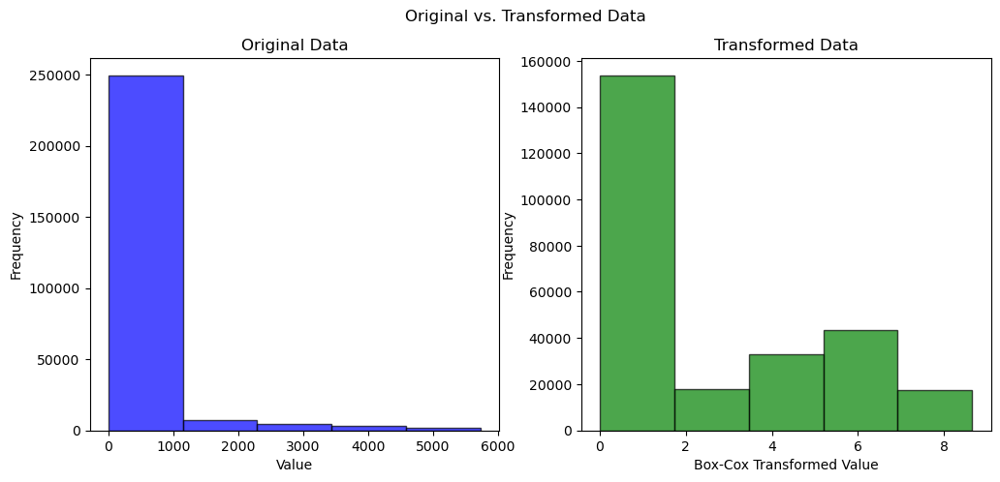

In [79]:
import matplotlib.pyplot as plt
original_data = df_filled['pv_measurement']

# Apply the Box-Cox transformation
transformed_data = np.log(original_data+1)

# Create a DataFrame to see the original and transformed data side by side
df = pd.DataFrame({'Original Data': original_data, 'Transformed Data': transformed_data})

# Create a figure and two subplots for original and transformed data
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
fig.suptitle('Original vs. Transformed Data')

# Plot the original data
axes[0].hist(original_data, bins=5, edgecolor='black', alpha=0.7, color='blue')
axes[0].set_title('Original Data')
axes[0].set_xlabel('Value')
axes[0].set_ylabel('Frequency')

# Plot the transformed data
axes[1].hist(transformed_data, bins=5, edgecolor='black', alpha=0.7, color='green')
axes[1].set_title('Transformed Data')
axes[1].set_xlabel('Box-Cox Transformed Value')
axes[1].set_ylabel('Frequency')

plt.show()

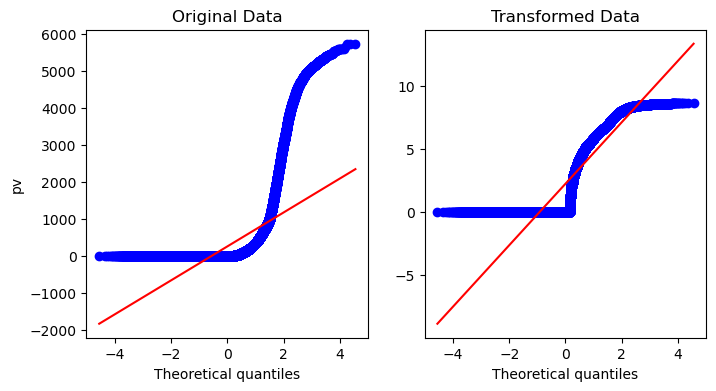

In [80]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))

prob = stats.probplot(original_data, dist=stats.norm, plot=ax1)
prob = stats.probplot(transformed_data, dist=stats.norm, plot=ax2)

ax1.set_title('Original Data')
ax1.set_ylabel('pv')
ax2.set_title('Transformed Data');
ax2.set_ylabel('');

### 3. Histogram


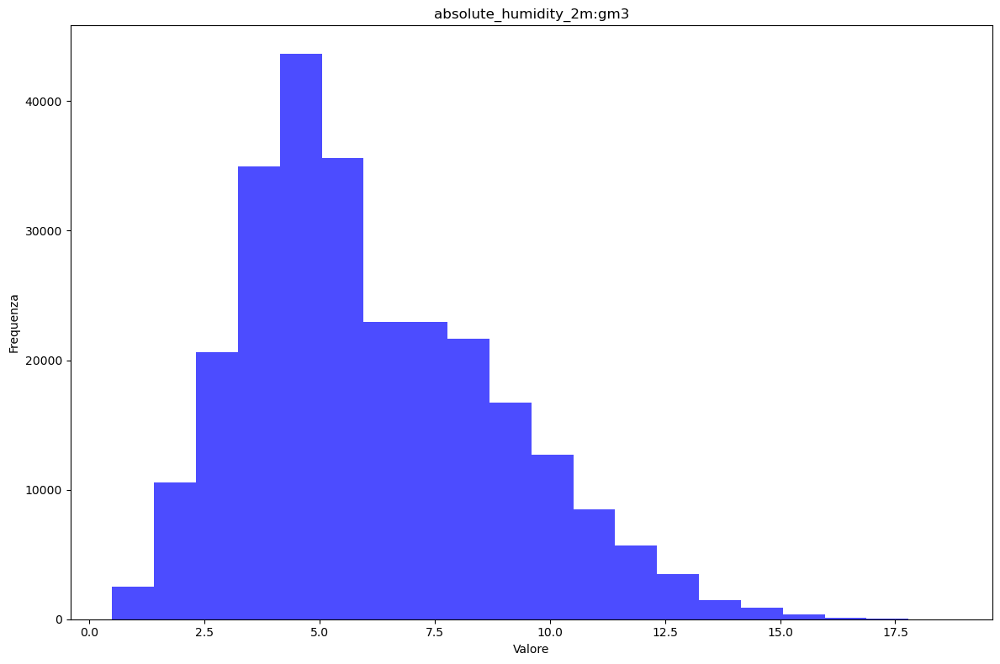

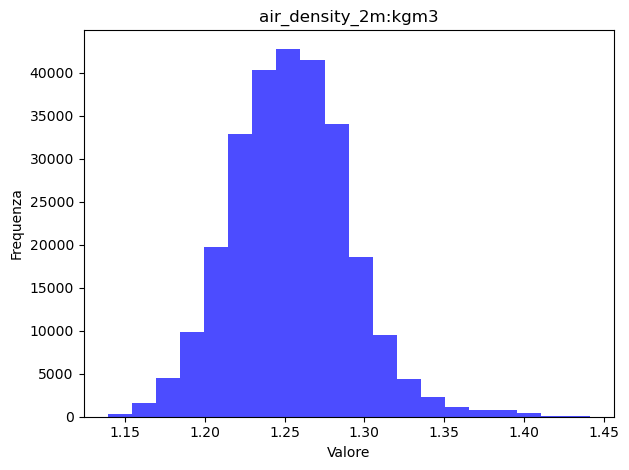

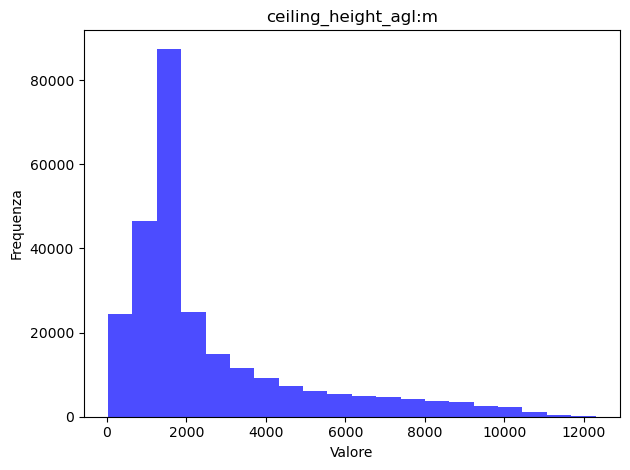

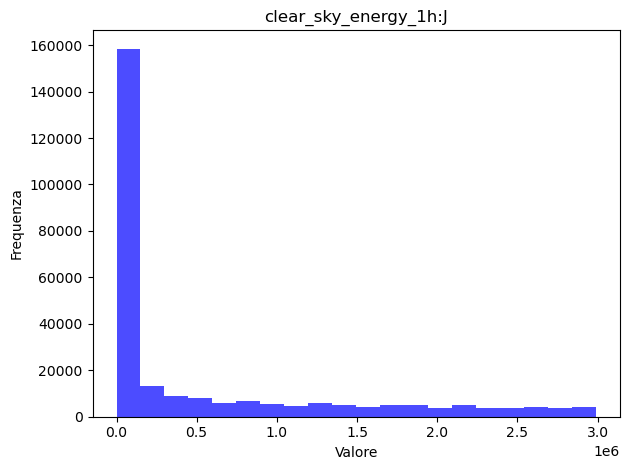

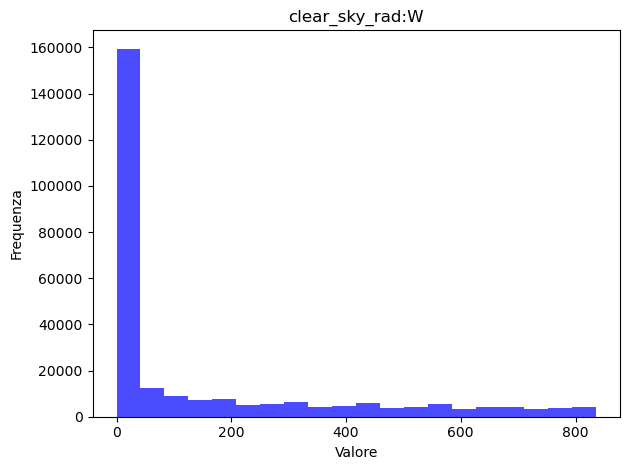

...

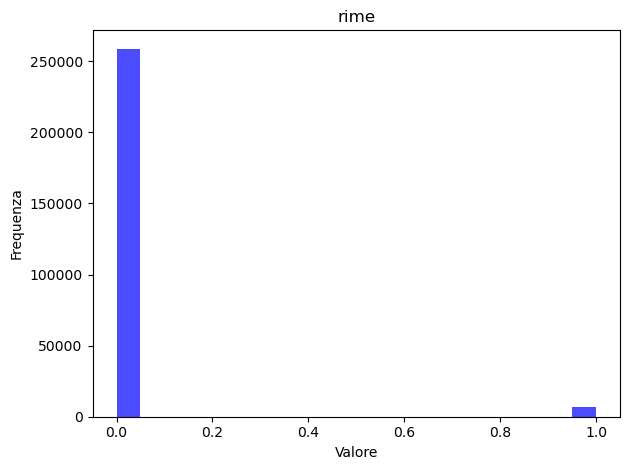

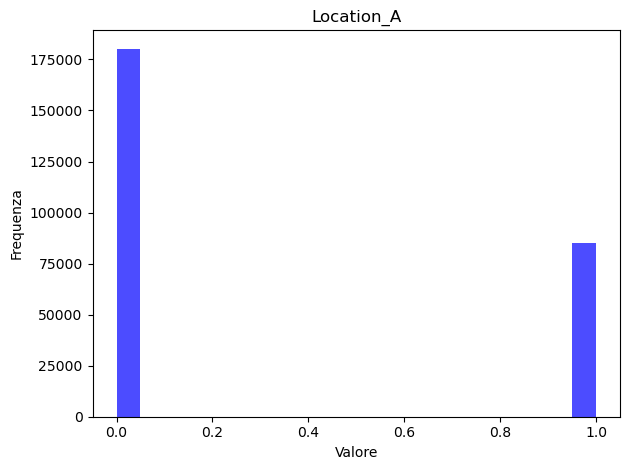

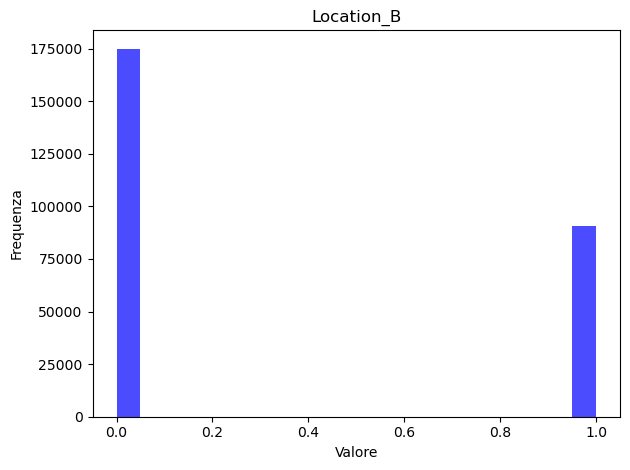

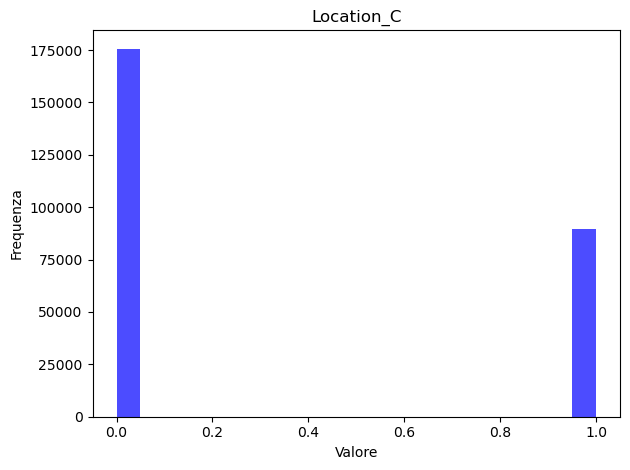

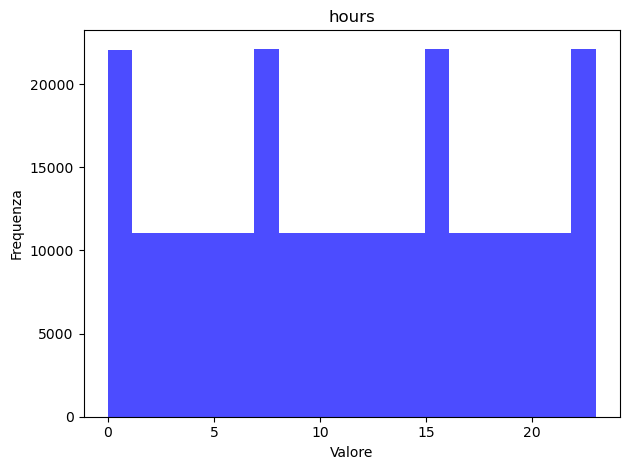

In [82]:
import math

# Carica il tuo dataset (sostituisci con il tuo DataFrame)
data = df_filled
# Calcola il numero di colonne e righe necessarie in base al numero di feature
num_features = len(data.columns)
num_rows = math.ceil(num_features / 3)  # Modifica 3 al numero di colonne per riga desiderato

# Imposta la dimensione della figura in base al numero di righe e colonne
plt.figure(figsize=(12, 8))

# Itera attraverso le colonne del DataFrame e crea un istogramma per ciascuna colonna
for i, column in enumerate(data.columns):
  #  plt.subplot(num_rows, 3, i + 1)  # Utilizza il numero di colonne per riga desiderato
    plt.hist(data[column], bins=20, color='blue', alpha=0.7)
    plt.title(column)
    plt.xlabel("Valore")
    plt.ylabel("Frequenza")
    plt.tight_layout()# Visualizza gli istogrammi
    plt.show()

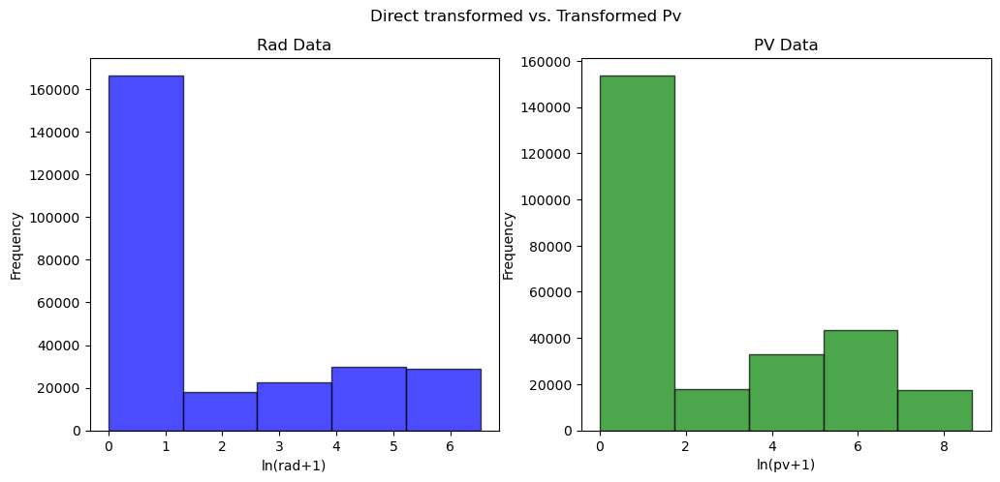

In [86]:
import matplotlib.pyplot as plt
original_data = df_filled['pv_measurement']
original_data_direct = df_filled['direct_rad:W']

# Apply the Box-Cox transformation
transformed_data = np.log(original_data+1)
transformed_data_direct = np.log(original_data_direct+1)


# Create a DataFrame to see the original and transformed data side by side
df = pd.DataFrame({'transformed_data_direct': transformed_data_direct, 'Transformed Data': transformed_data})

# Create a figure and two subplots for original and transformed data
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
fig.suptitle('Direct transformed vs. Transformed Pv')

# Plot the original data
axes[0].hist(transformed_data_direct, bins=5, edgecolor='black', alpha=0.7, color='blue')
axes[0].set_title('Rad Data')
axes[0].set_xlabel('ln(rad+1)')
axes[0].set_ylabel('Frequency')

# Plot the transformed data
axes[1].hist(transformed_data, bins=5, edgecolor='black', alpha=0.7, color='green')
axes[1].set_title('PV Data')
axes[1].set_xlabel('ln(pv+1)')
axes[1].set_ylabel('Frequency')

plt.show()

### 3.1 Scaling

In [122]:
scaling_columns = df_filled.drop(columns = ['Location_A','Location_B','Location_C','hours','dew','rime','pv_measurement']).columns
scaling_columns

Index(['absolute_humidity_2m:gm3', 'air_density_2m:kgm3',
       'ceiling_height_agl:m', 'clear_sky_energy_1h:J', 'clear_sky_rad:W',
       'cloud_base_agl:m', 'dew_point_2m:K', 'diffuse_rad:W',
       'diffuse_rad_1h:J', 'direct_rad:W', 'direct_rad_1h:J',
       'effective_cloud_cover:p', 'elevation:m', 'fresh_snow_12h:cm',
       'fresh_snow_1h:cm', 'fresh_snow_24h:cm', 'fresh_snow_3h:cm',
       'fresh_snow_6h:cm', 'is_day:idx', 'is_in_shadow:idx',
       'msl_pressure:hPa', 'precip_5min:mm', 'precip_type_5min:idx',
       'pressure_100m:hPa', 'pressure_50m:hPa', 'prob_rime:p',
       'rain_water:kgm2', 'relative_humidity_1000hPa:p', 'sfc_pressure:hPa',
       'snow_density:kgm3', 'snow_depth:cm', 'snow_drift:idx',
       'snow_melt_10min:mm', 'snow_water:kgm2', 'sun_azimuth:d',
       'sun_elevation:d', 'super_cooled_liquid_water:kgm2', 't_1000hPa:K',
       'total_cloud_cover:p', 'visibility:m', 'wind_speed_10m:ms',
       'wind_speed_u_10m:ms', 'wind_speed_v_10m:ms',
       'wind

In [123]:
from sklearn.preprocessing import StandardScaler
norm = StandardScaler()
X_norm =pd.DataFrame( norm.fit_transform(df_filled[scaling_columns]), columns = df_filled[scaling_columns].columns, index = df_filled.index)
X_norm.describe()

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,direct_rad:W,...,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms
count,2.654200e+05,2.654200e+05,2.654200e+05,2.654200e+05,2.654200e+05,2.654200e+05,2.654200e+05,2.654200e+05,2.654200e+05,2.654200e+05,...,2.654200e+05,2.654200e+05,2.654200e+05,2.654200e+05,2.654200e+05,2.654200e+05,2.654200e+05,2.654200e+05,2.654200e+05,2.654200e+05
mean,7.195912e-17,-1.361398e-14,-6.896082e-17,2.253006e-16,1.456315e-16,-6.628377e-17,7.140229e-15,-7.367243e-17,-1.147919e-16,9.080555e-17,...,-1.196508e-16,-2.826965e-17,-7.281577e-17,1.341524e-15,-1.053687e-16,-1.087953e-16,7.585690e-16,1.627647e-17,-2.141640e-17,-9.423218e-18
std,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,...,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00
min,-2.041275e+00,-3.109515e+00,-1.128387e+00,-6.406503e-01,-6.390212e-01,-9.668708e-01,-4.084279e+00,-6.609631e-01,-6.688714e-01,-4.524460e-01,...,-1.772117e+00,-2.052347e+00,-5.451577e-01,-3.280578e+00,-2.165090e+00,-1.829604e+00,-1.710953e+00,-2.868719e+00,-4.818645e+00,-1.535631e+01
25%,-7.332139e-01,-6.761142e-01,-6.198628e-01,-6.406503e-01,-6.390212e-01,-6.089969e-01,-6.591875e-01,-6.609631e-01,-6.688714e-01,-4.524460e-01,...,-8.742303e-01,-7.149316e-01,-5.451577e-01,-6.948270e-01,-6.075984e-01,-9.087041e-01,-7.815164e-01,-7.233571e-01,-6.767237e-01,-7.416530e-03
50%,-2.154397e-01,-1.862168e-02,-3.527948e-01,-6.219913e-01,-6.283525e-01,-2.982727e-01,-4.041433e-02,-6.372117e-01,-6.064777e-01,-4.524460e-01,...,3.747939e-03,9.015857e-03,-5.451577e-01,-1.193744e-01,5.610723e-01,2.268308e-01,-1.952567e-01,-1.349666e-01,1.359655e-02,-7.416530e-03
75%,6.747687e-01,6.388682e-01,2.253536e-01,3.778752e-01,3.706249e-01,1.653729e-01,7.749104e-01,4.451111e-01,4.487618e-01,-1.684621e-01,...,8.728387e-01,6.966500e-01,3.883950e-01,6.908022e-01,7.768383e-01,8.530451e-01,5.768904e-01,6.525713e-01,6.375398e-01,-7.416530e-03
max,4.571701e+00,5.071862e+00,4.208612e+00,2.949352e+00,2.963117e+00,5.781093e+00,2.831421e+00,4.822315e+00,4.848755e+00,5.478024e+00,...,1.732602e+00,2.103280e+00,1.229119e+01,3.568065e+00,7.805203e-01,2.359522e+00,5.867527e+00,3.802723e+00,4.328098e+00,1.534148e+01


In [125]:
for col in ['Location_A','Location_B','Location_C','hours','dew','rime']:
    X_norm[col] = df_filled[col]
X_norm['pv_measurement'] = np.log(df_filled['pv_measurement']+1)
X_norm.describe()

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,direct_rad:W,...,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,Location_A,Location_B,Location_C,hours,dew,rime,pv_measurement
count,2.654200e+05,2.654200e+05,2.654200e+05,2.654200e+05,2.654200e+05,2.654200e+05,2.654200e+05,2.654200e+05,2.654200e+05,2.654200e+05,...,2.654200e+05,2.654200e+05,2.654200e+05,265420.000000,265420.000000,265420.000000,265420.000000,265420.000000,265420.000000,265420.000000
mean,7.195912e-17,-1.361398e-14,-6.896082e-17,2.253006e-16,1.456315e-16,-6.628377e-17,7.140229e-15,-7.367243e-17,-1.147919e-16,9.080555e-17,...,1.627647e-17,-2.141640e-17,-9.423218e-18,0.320880,0.340909,0.338211,11.501839,0.028114,0.025036,2.248820
std,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,...,1.000002e+00,1.000002e+00,1.000002e+00,0.466816,0.474016,0.473102,6.919988,0.165299,0.156234,2.800120
min,-2.041275e+00,-3.109515e+00,-1.128387e+00,-6.406503e-01,-6.390212e-01,-9.668708e-01,-4.084279e+00,-6.609631e-01,-6.688714e-01,-4.524460e-01,...,-2.868719e+00,-4.818645e+00,-1.535631e+01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-7.332139e-01,-6.761142e-01,-6.198628e-01,-6.406503e-01,-6.390212e-01,-6.089969e-01,-6.591875e-01,-6.609631e-01,-6.688714e-01,-4.524460e-01,...,-7.233571e-01,-6.767237e-01,-7.416530e-03,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000
50%,-2.154397e-01,-1.862168e-02,-3.527948e-01,-6.219913e-01,-6.283525e-01,-2.982727e-01,-4.041433e-02,-6.372117e-01,-6.064777e-01,-4.524460e-01,...,-1.349666e-01,1.359655e-02,-7.416530e-03,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000
75%,6.747687e-01,6.388682e-01,2.253536e-01,3.778752e-01,3.706249e-01,1.653729e-01,7.749104e-01,4.451111e-01,4.487618e-01,-1.684621e-01,...,6.525713e-01,6.375398e-01,-7.416530e-03,1.000000,1.000000,1.000000,17.000000,0.000000,0.000000,4.934474
max,4.571701e+00,5.071862e+00,4.208612e+00,2.949352e+00,2.963117e+00,5.781093e+00,2.831421e+00,4.822315e+00,4.848755e+00,5.478024e+00,...,3.802723e+00,4.328098e+00,1.534148e+01,1.000000,1.000000,1.000000,23.000000,1.000000,1.000000,8.654242


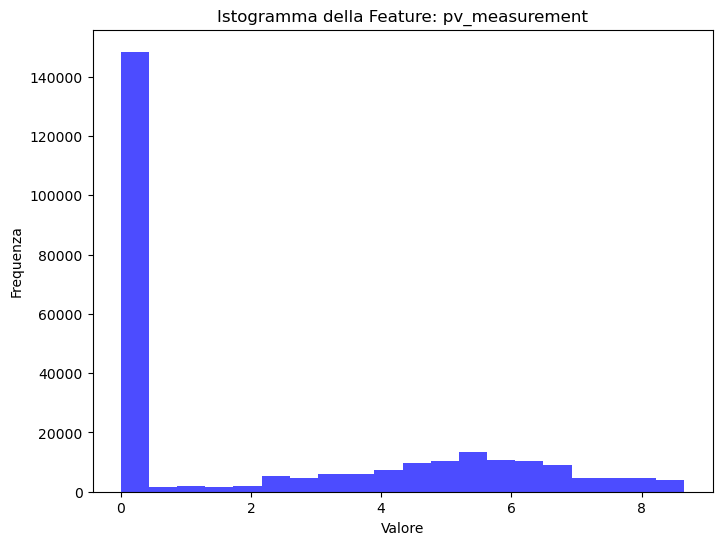

In [127]:
original_data = X_norm['pv_measurement']

plt.figure(figsize=(8, 6))

# Crea l'istogramma
plt.hist(original_data, bins=20, color='blue', alpha=0.7)

# Personalizza il titolo e le etichette degli assi
plt.title(f"Istogramma della Feature: {original_data.name}")
plt.xlabel("Valore")
plt.ylabel("Frequenza")


plt.show()

## 4. Test Analysis


We must see them separated, but we have to implement every feature we created for train dataset.
Since we removed snow_density in train, we must do it also here. But as we can see for location B and C was 100% NaN

In [269]:
df_test_A = df_test_A.drop(columns='snow_density:kgm3')
df_test_A

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,...,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms
date_forecast,,,,,,,,,,,,,,,,,,,,,
2023-05-01 00:00:00,4.325,1.28675,912.7000,0.000,0.000,1061.5500,0.0,271.65002,0.000,0.000,...,16.02650,-10.54100,0.000,273.80000,74.950,29907.500,3.950,2.100,3.350,0.0
2023-05-01 01:00:00,4.275,1.28600,1527.6500,0.000,0.000,1075.1001,0.0,271.45000,0.000,0.000,...,30.49725,-7.89450,0.000,273.80000,77.475,29519.074,3.825,1.925,3.300,0.0
2023-05-01 02:00:00,4.150,1.28375,1791.3000,0.000,0.000,1200.4000,0.0,271.05000,0.000,0.000,...,44.51725,-3.81550,0.000,273.84998,88.100,31009.125,3.650,1.750,3.200,0.0
2023-05-01 03:00:00,4.025,1.28200,2312.8750,10124.425,11.675,1179.8500,0.0,270.65000,9.375,16845.227,...,58.08300,1.41250,0.000,273.90000,68.600,34552.500,3.500,1.450,3.150,0.0
2023-05-01 04:00:00,3.900,1.28100,2198.2998,141748.600,76.875,920.0500,0.0,270.37500,47.400,102209.700,...,71.34100,7.46850,0.000,273.92500,66.300,35483.875,3.325,1.300,3.050,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-03 19:00:00,8.350,1.19725,3638.9000,477093.200,85.100,2013.7500,0.0,281.57500,33.625,168774.550,...,306.68700,8.15300,0.100,287.02500,86.150,44056.375,2.450,2.075,-1.350,0.0
2023-07-03 20:00:00,8.525,1.20050,3552.1000,184335.670,24.800,1610.9000,0.0,281.85000,14.325,86321.125,...,319.70400,3.26800,0.000,286.60000,75.325,44017.176,2.450,2.100,-1.250,0.0
2023-07-03 21:00:00,8.825,1.20450,2152.3250,37429.330,1.275,1622.8000,0.0,282.32500,1.300,28169.150,...,333.04000,-0.44325,0.000,286.10000,76.850,43302.050,2.575,2.150,-1.400,0.0


In [270]:
df_test_A.isna().mean()

absolute_humidity_2m:gm3          0.0
air_density_2m:kgm3               0.0
ceiling_height_agl:m              0.0
clear_sky_energy_1h:J             0.0
clear_sky_rad:W                   0.0
cloud_base_agl:m                  0.0
dew_or_rime:idx                   0.0
dew_point_2m:K                    0.0
diffuse_rad:W                     0.0
diffuse_rad_1h:J                  0.0
direct_rad:W                      0.0
direct_rad_1h:J                   0.0
effective_cloud_cover:p           0.0
elevation:m                       0.0
fresh_snow_12h:cm                 0.0
fresh_snow_1h:cm                  0.0
fresh_snow_24h:cm                 0.0
fresh_snow_3h:cm                  0.0
fresh_snow_6h:cm                  0.0
is_day:idx                        0.0
is_in_shadow:idx                  0.0
msl_pressure:hPa                  0.0
precip_5min:mm                    0.0
precip_type_5min:idx              0.0
pressure_100m:hPa                 0.0
pressure_50m:hPa                  0.0
prob_rime:p 

In [271]:
df_test_B = df_test_B.drop(columns='snow_density:kgm3')

df_test_B.describe()

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,...,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms
count,720.000000,720.000000,540.000000,7.200000e+02,720.000000,655.000000,720.000000,720.000000,720.000000,7.200000e+02,...,720.000000,720.000000,720.000000,720.000000,720.000000,720.000000,720.000000,720.000000,720.000000,720.0
mean,8.214132,1.234833,3088.786527,1.227648e+06,341.013195,1899.517520,0.027778,280.790625,84.900104,3.056382e+05,...,179.181983,20.294483,0.063958,284.723333,69.312604,32903.432018,3.079306,1.741771,-0.219271,0.0
std,2.183560,0.030700,2930.013998,1.101470e+06,306.909891,2110.966647,0.157979,4.340314,78.588093,2.783122e+05,...,103.971258,18.629860,0.108871,5.811224,37.672732,14965.609072,1.797978,2.719246,1.488777,0.0
min,3.200000,1.156500,46.450000,0.000000e+00,0.000000,30.250000,0.000000,268.075000,0.000000,0.000000e+00,...,13.442500,-11.534250,0.000000,273.800000,0.000000,2111.450000,0.100000,-4.300000,-4.300000,0.0
25%,6.693750,1.212500,987.843750,4.881146e+04,17.956250,519.587500,0.000000,278.000000,8.087500,3.417926e+04,...,89.982309,2.448000,0.000000,279.849980,38.925000,19384.826500,1.593750,-0.300000,-1.300000,0.0
50%,8.062500,1.240375,1722.525000,9.338161e+05,299.575000,1059.750000,0.000000,281.025000,75.300000,2.656505e+05,...,180.961745,19.800625,0.000000,284.787500,91.600000,36560.237000,2.950000,1.737500,-0.300000,0.0
75%,9.981250,1.260000,4072.293750,2.276143e+06,661.737500,2436.300000,0.000000,284.375000,134.237503,4.892197e+05,...,271.245248,38.861251,0.100000,288.175005,100.000000,44646.550000,4.225000,3.750000,0.750000,0.0
max,13.700000,1.299000,11430.900000,2.987513e+06,834.950000,11256.800000,1.000000,289.500000,307.599980,1.099236e+06,...,348.119260,49.903000,0.600000,301.925000,100.000000,61136.625000,9.100000,9.050000,3.800000,0.0


In [272]:
df_test_B.isna().mean()

absolute_humidity_2m:gm3          0.531250
air_density_2m:kgm3               0.531250
ceiling_height_agl:m              0.648438
clear_sky_energy_1h:J             0.531250
clear_sky_rad:W                   0.531250
cloud_base_agl:m                  0.573568
dew_or_rime:idx                   0.531250
dew_point_2m:K                    0.531250
diffuse_rad:W                     0.531250
diffuse_rad_1h:J                  0.531250
direct_rad:W                      0.531250
direct_rad_1h:J                   0.531250
effective_cloud_cover:p           0.531250
elevation:m                       0.531250
fresh_snow_12h:cm                 0.531250
fresh_snow_1h:cm                  0.531250
fresh_snow_24h:cm                 0.531250
fresh_snow_3h:cm                  0.531250
fresh_snow_6h:cm                  0.531250
is_day:idx                        0.531250
is_in_shadow:idx                  0.531250
msl_pressure:hPa                  0.531250
precip_5min:mm                    0.531250
precip_type

In [273]:
df_test_C = df_test_C.drop(columns='snow_density:kgm3')

df_test_C.describe()

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,...,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms
count,720.000000,720.000000,518.000000,7.200000e+02,720.000000,632.000000,720.000000,720.000000,720.000000,7.200000e+02,...,720.000000,720.000000,720.000000,720.000000,720.000000,720.000000,720.000000,720.000000,720.000000,720.000000
mean,8.186215,1.230337,3010.387981,1.227943e+06,341.095035,1833.726506,0.045833,280.746215,84.465174,3.040739e+05,...,179.178252,20.290613,0.065694,284.801424,69.156354,33541.437622,2.683021,1.476354,-0.109167,0.001076
std,2.215325,0.033162,2985.238450,1.102405e+06,307.171197,2040.098636,0.211746,4.417987,78.225869,2.770149e+05,...,103.978296,18.656084,0.109883,5.877520,37.996887,15433.890811,1.506279,2.240871,1.494772,0.009493
min,3.700000,1.142750,54.850000,0.000000e+00,0.000000,33.000000,-1.000000,269.450000,0.000000,0.000000e+00,...,13.439500,-11.573000,0.000000,273.700000,0.000000,1532.175000,0.250000,-3.650000,-3.900000,0.000000
25%,6.600000,1.206375,917.268750,4.802339e+04,17.743750,490.018750,0.000000,277.824980,7.743750,3.440522e+04,...,89.976438,2.418375,0.000000,279.918750,36.212500,20340.418750,1.468750,-0.100000,-1.225000,0.000000
50%,8.012500,1.234500,1563.075000,9.329360e+05,299.462500,1028.537500,0.000000,281.050000,74.962500,2.641501e+05,...,180.957750,19.793875,0.000000,284.900000,93.112500,38082.750000,2.550000,1.437500,-0.200000,0.000000
75%,10.000000,1.258000,3952.925000,2.277667e+06,662.112500,2391.900000,0.000000,284.381250,134.525000,4.857861e+05,...,271.258445,38.882438,0.100000,288.274995,100.000000,45452.918000,3.606250,3.100000,0.900000,0.000000
max,14.125000,1.300500,11468.000000,2.989497e+06,835.525000,11467.800000,1.000000,290.050000,299.975000,1.052429e+06,...,348.115000,49.941500,0.600000,302.125000,100.000000,62924.850000,7.450000,7.450000,3.750000,0.100000


In [274]:
df_test_C.isna().mean()

absolute_humidity_2m:gm3          0.531250
air_density_2m:kgm3               0.531250
ceiling_height_agl:m              0.662760
clear_sky_energy_1h:J             0.531250
clear_sky_rad:W                   0.531250
cloud_base_agl:m                  0.588542
dew_or_rime:idx                   0.531250
dew_point_2m:K                    0.531250
diffuse_rad:W                     0.531250
diffuse_rad_1h:J                  0.531250
direct_rad:W                      0.531250
direct_rad_1h:J                   0.531250
effective_cloud_cover:p           0.531250
elevation:m                       0.531250
fresh_snow_12h:cm                 0.531250
fresh_snow_1h:cm                  0.531250
fresh_snow_24h:cm                 0.531250
fresh_snow_3h:cm                  0.531250
fresh_snow_6h:cm                  0.531250
is_day:idx                        0.531250
is_in_shadow:idx                  0.531250
msl_pressure:hPa                  0.531250
precip_5min:mm                    0.531250
precip_type

### 4.1 Imputation

We try with KNN

In [275]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=24)

In [276]:
df_test_A_imputed = pd.DataFrame(imputer.fit_transform(df_test_A), columns = df_test_A.columns, index = df_test_A.index)

In [277]:
df_test_B_imputed = pd.DataFrame(imputer.fit_transform(df_test_B), columns = df_test_B.columns, index = df_test_B.index)

In [278]:
df_test_C_imputed = pd.DataFrame(imputer.fit_transform(df_test_C), columns = df_test_C.columns, index = df_test_C.index)

In [279]:
df_test_A_imputed.isna().mean()

absolute_humidity_2m:gm3          0.0
air_density_2m:kgm3               0.0
ceiling_height_agl:m              0.0
clear_sky_energy_1h:J             0.0
clear_sky_rad:W                   0.0
cloud_base_agl:m                  0.0
dew_or_rime:idx                   0.0
dew_point_2m:K                    0.0
diffuse_rad:W                     0.0
diffuse_rad_1h:J                  0.0
direct_rad:W                      0.0
direct_rad_1h:J                   0.0
effective_cloud_cover:p           0.0
elevation:m                       0.0
fresh_snow_12h:cm                 0.0
fresh_snow_1h:cm                  0.0
fresh_snow_24h:cm                 0.0
fresh_snow_3h:cm                  0.0
fresh_snow_6h:cm                  0.0
is_day:idx                        0.0
is_in_shadow:idx                  0.0
msl_pressure:hPa                  0.0
precip_5min:mm                    0.0
precip_type_5min:idx              0.0
pressure_100m:hPa                 0.0
pressure_50m:hPa                  0.0
prob_rime:p 

In [280]:
df_test_B_imputed.isna().mean()

absolute_humidity_2m:gm3          0.0
air_density_2m:kgm3               0.0
ceiling_height_agl:m              0.0
clear_sky_energy_1h:J             0.0
clear_sky_rad:W                   0.0
cloud_base_agl:m                  0.0
dew_or_rime:idx                   0.0
dew_point_2m:K                    0.0
diffuse_rad:W                     0.0
diffuse_rad_1h:J                  0.0
direct_rad:W                      0.0
direct_rad_1h:J                   0.0
effective_cloud_cover:p           0.0
elevation:m                       0.0
fresh_snow_12h:cm                 0.0
fresh_snow_1h:cm                  0.0
fresh_snow_24h:cm                 0.0
fresh_snow_3h:cm                  0.0
fresh_snow_6h:cm                  0.0
is_day:idx                        0.0
is_in_shadow:idx                  0.0
msl_pressure:hPa                  0.0
precip_5min:mm                    0.0
precip_type_5min:idx              0.0
pressure_100m:hPa                 0.0
pressure_50m:hPa                  0.0
prob_rime:p 

In [281]:
df_test_C_imputed.isna().mean()

absolute_humidity_2m:gm3          0.0
air_density_2m:kgm3               0.0
ceiling_height_agl:m              0.0
clear_sky_energy_1h:J             0.0
clear_sky_rad:W                   0.0
cloud_base_agl:m                  0.0
dew_or_rime:idx                   0.0
dew_point_2m:K                    0.0
diffuse_rad:W                     0.0
diffuse_rad_1h:J                  0.0
direct_rad:W                      0.0
direct_rad_1h:J                   0.0
effective_cloud_cover:p           0.0
elevation:m                       0.0
fresh_snow_12h:cm                 0.0
fresh_snow_1h:cm                  0.0
fresh_snow_24h:cm                 0.0
fresh_snow_3h:cm                  0.0
fresh_snow_6h:cm                  0.0
is_day:idx                        0.0
is_in_shadow:idx                  0.0
msl_pressure:hPa                  0.0
precip_5min:mm                    0.0
precip_type_5min:idx              0.0
pressure_100m:hPa                 0.0
pressure_50m:hPa                  0.0
prob_rime:p 

### 4.2 Outliers handling

In [282]:
def outliers_handling(df):
    # Sample dataset with outliers
    df_no_outliers = df
    # Calculate Z-scores for each column
    z_scores = np.abs(stats.zscore(df_no_outliers))

    # Define a Z-score threshold (e.g., 2 standard deviations)
    z_score_threshold = 2

    # Create a boolean mask for identifying outliers
    outlier_mask = z_scores > z_score_threshold
    # Define the window size (12 values before and 12 values after)
    window_size = 12

    # Replace outliers with the mean of the surrounding values for each column
    for column in df_no_outliers.columns:
        for i in range(len(df_no_outliers)):
            if outlier_mask[column][i]:
                start = max(i - window_size, 0)
                end = min(i + window_size + 1, len(df_no_outliers))
                df_no_outliers[column][i] = df_no_outliers[column][start:end].mean()
    return df_no_outliers

In [284]:
df_test_A_outlier = outliers_handling(df_test_A_imputed)
df_test_B_outlier = outliers_handling(df_test_B_imputed)
df_test_C_outlier = outliers_handling(df_test_C_imputed)

### 4.3 Adding feature

In [289]:
df_test_A_outlier['Location_A'] = '1'
df_test_A_outlier['Location_B'] = '0'
df_test_A_outlier['Location_C'] = '0'

df_test_B_outlier['Location_A'] = '0'
df_test_B_outlier['Location_B'] = '1'
df_test_B_outlier['Location_C'] = '0'

df_test_C_outlier['Location_A'] = '0'
df_test_C_outlier['Location_B'] = '0'
df_test_C_outlier['Location_C'] = '1'

In [290]:
df_test_A_outlier.head()

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,...,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,Location_A,Location_B,Location_C
date_forecast,,,,,,,,,,,,,,,,,,,,,
2023-05-01 00:00:00,4.325000,1.28675,912.7000,0.000,0.000,1061.5500,0.0,271.153916,0.000,0.000,...,273.80000,74.950,29907.500,3.950,2.100,1.834615,0.0,1,0,0
2023-05-01 01:00:00,4.275000,1.28600,1527.6500,0.000,0.000,1075.1001,0.0,271.163633,0.000,0.000,...,273.80000,77.475,29519.074,3.825,1.925,1.475687,0.0,1,0,0
2023-05-01 02:00:00,4.150000,1.28375,1791.3000,0.000,0.000,1200.4000,0.0,271.170474,0.000,0.000,...,273.84998,88.100,31009.125,3.650,1.750,1.152353,0.0,1,0,0
2023-05-01 03:00:00,4.025000,1.28200,2312.8750,10124.425,11.675,1179.8500,0.0,271.178228,9.375,16845.227,...,273.90000,68.600,34552.500,3.500,1.450,0.861728,0.0,1,0,0
2023-05-01 04:00:00,4.113235,1.28100,2198.2998,141748.600,76.875,920.0500,0.0,271.189296,47.400,102209.700,...,273.92500,66.300,35483.875,3.325,1.300,0.589670,0.0,1,0,0


In [291]:
df_test_B_outlier.head()

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,...,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,Location_A,Location_B,Location_C
date_forecast,,,,,,,,,,,,,,,,,,,,,
2023-05-01 00:00:00,4.128846,1.272327,912.3000,0.00,0.000,1059.75,0.0,271.092308,0.000,0.000,...,275.009612,75.000,31107.600,3.950,2.100,1.840385,0.0,0,1,0
2023-05-01 01:00:00,4.132418,1.270988,1482.8002,0.00,0.000,1073.70,0.0,271.106592,0.000,0.000,...,275.168541,77.500,30409.700,3.825,1.925,1.481456,0.0,0,1,0
2023-05-01 02:00:00,4.125751,1.269671,1765.9000,0.00,0.000,1200.10,0.0,271.089925,0.000,0.000,...,275.338540,88.100,31342.650,3.650,1.750,1.158123,0.0,0,1,0
2023-05-01 03:00:00,4.116376,1.268405,2269.7500,10127.55,11.675,1179.00,0.0,271.068050,9.375,16845.576,...,275.499478,68.775,34475.523,3.500,1.475,0.865935,0.0,0,1,0
2023-05-01 04:00:00,4.109023,1.267302,2198.2250,141764.28,76.900,919.15,0.0,271.059227,47.400,102203.050,...,275.649478,66.350,35069.074,3.325,1.300,0.593876,0.0,0,1,0


In [292]:
df_test_C_outlier.head()

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,...,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,Location_A,Location_B,Location_C
date_forecast,,,,,,,,,,,,,,,,,,,,,
2023-05-01 00:00:00,3.982692,1.270058,3117.179150,0.00,0.000000,1236.500,0.0,270.598077,0.000,0.000,...,275.001922,69.300,31241.975,3.425,1.450,1.725000,0.0,0,0,1
2023-05-01 01:00:00,3.995192,1.268236,1477.100000,0.00,0.000000,1220.425,0.0,270.655220,0.000,0.000,...,275.162636,78.525,31019.550,3.325,1.400,1.385714,0.0,0,0,1
2023-05-01 02:00:00,3.998526,1.266453,1477.100000,0.00,0.000000,1258.650,0.0,270.683553,0.000,0.000,...,275.330969,89.275,32372.800,3.225,1.225,1.082381,0.0,0,0,1
2023-05-01 03:00:00,4.001651,1.264859,4405.346862,9972.50,11.549999,1655.175,0.0,270.705428,9.300,16722.225,...,275.490345,57.750,35433.625,3.125,0.950,0.804256,0.0,0,0,1
2023-05-01 04:00:00,4.006062,1.263492,1990.000000,141106.67,76.675000,1639.100,0.0,270.734840,47.925,103007.420,...,275.634463,60.475,35455.574,3.025,0.700,0.548374,0.0,0,0,1


In [293]:
df_test_A_outlier.index = pd.to_datetime(df_test_A_outlier.index)
df_test_B_outlier.index = pd.to_datetime(df_test_B_outlier.index)
df_test_C_outlier.index = pd.to_datetime(df_test_C_outlier.index)

In [294]:
df_test_A_outlier['hours'] = df_test_A_outlier.index.hour
df_test_B_outlier['hours'] = df_test_B_outlier.index.hour
df_test_C_outlier['hours'] = df_test_C_outlier.index.hour

In [296]:
def dew_rime_maker(df):
    df_dew_rime = df
    df_dew_rime['dew'] = np.where(df_dew_rime['dew_or_rime:idx'] == 1, 1, 0)
    df_dew_rime['rime'] = np.where(df_dew_rime['dew_or_rime:idx'] == -1, 1, 0)
    df_dew_rime = df_dew_rime.drop(columns = 'dew_or_rime:idx')
    return df_dew_rime

In [297]:
df_test_A = dew_rime_maker(df_test_A_outlier)
df_test_B = dew_rime_maker(df_test_B_outlier)
df_test_C = dew_rime_maker(df_test_C_outlier)